In [ ]:
# Importing necessary libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

trainset = torchvision.datasets.MNIST(root='./data', train=True, transform=transform, download=True)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

testset = torchvision.datasets.MNIST(root='./data', train=False, transform=transform, download=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=False)

cuda


# Custom MLP

In [ ]:
class Perceptron(nn.Module):
  def __init__(self, num_inputs):
    super(Perceptron, self).__init__()
    self.weights = nn.Parameter(nn.init.xavier_uniform_(torch.Tensor(1, num_inputs)))
    self.bias = nn.Parameter((torch.randn(1)))

  def propagate(self, inputs):
    output = torch.dot(inputs, self.weights.view(-1)) + self.bias
    return output

class MultiLayerPerceptron(nn.Module):
  def __init__(self):
    super(MultiLayerPerceptron, self).__init__()
    self.hidden_layer1 = nn.ModuleList([Perceptron(28*28) for i in range(128)])
    self.hidden_layer2 = nn.ModuleList([Perceptron(128) for i in range(64)])
    self.output_layer = nn.ModuleList([Perceptron(64) for i in range(10)])

  def propagate(self, inputs):
        # Flatten the input data
        inputs = inputs.view(-1, 28*28)

        # Store the matrices of weights
        hidden1_weights = torch.stack([perceptron.weights for perceptron in self.hidden_layer1])
        hidden1_weights = hidden1_weights.squeeze(dim=1)
        hidden2_weights = torch.stack([perceptron.weights for perceptron in self.hidden_layer2])
        hidden2_weights = hidden2_weights.squeeze(dim=1)
        output_weights = torch.stack([perceptron.weights for perceptron in self.output_layer])
        output_weights = output_weights.squeeze(dim=1)

        # Store the vectors of biases
        hidden1_bias = torch.stack([perceptron.bias for perceptron in self.hidden_layer1])
        hidden1_bias = hidden1_bias.view(-1)
        hidden2_bias = torch.stack([perceptron.bias for perceptron in self.hidden_layer2])
        hidden2_bias = hidden2_bias.view(-1)
        output_bias = torch.stack([perceptron.bias for perceptron in self.output_layer])
        output_bias = output_bias.view(-1)

        # Creating output list
        outputs_list = []

        for picture, pixels in enumerate(inputs):
          pixels = torch.relu(F.linear(pixels, hidden1_weights, hidden1_bias))
          pixels = torch.relu(F.linear(pixels, hidden2_weights, hidden2_bias))
          outputs_list.append(F.linear(pixels, output_weights, output_bias))

        # Concatenate the output tensors along the 0th dimension
        output = torch.stack(outputs_list)
        return output.squeeze()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Model Testing
model = MultiLayerPerceptron()
weights_path = '/content/drive/My Drive/Colab Notebooks/CSE498R/a_498R_custom_model_weights.pth'
model.load_state_dict(torch.load(weights_path))
model.eval()
correct = 0
total = 0
with torch.no_grad():
  for batch in testloader:
    images, labels = batch
    outputs = model.propagate(images)
    _,predicted = torch.max(outputs.data, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()
accuracy1 = (correct / total)*100
print(accuracy1, "%")

95.66 %


#Kernel Distribution Estimation

## Gaussian Kernel

In [ ]:
# # Importing the necessary libraries
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.stats import gaussian_kde

# # Bandwidth parameter (adjust this)
# bandwidth = 0.1

# def plot_kde(weights, name):
#     plt.figure(figsize=(8, 4))
#     plt.title(f'{name} - Epoch 1 - 10')

#     for epoch in range(num_epochs):
#         # Create a KDE object with Gaussian kernel
#         kde = gaussian_kde(weights[epoch][0][0], bw_method=bandwidth)

#         # Define a range of x values for the PDF
#         x_values = np.linspace(min(weights[epoch][0][0]), max(weights[epoch][0][0]), 1000)

#         # Calculate the estimated PDF at each x value
#         pdf_values = kde(x_values)

#         # Plot the KDE estimate
#         plt.plot(x_values, pdf_values, label=f'Epoch {epoch + 1}')
#     # plt.title(f'KDE with Gaussian Kernel - Epoch {epoch + 1}')
#     plt.xlabel('Weight')
#     plt.ylabel('Estimated Density')
#     plt.legend()
#     plt.show()

# # Loop through weight distributions for each epoch
# for idx, (name, param) in enumerate(model.named_parameters()):
#   if 'weight' in name:
#       plot_kde([weight_history[i][idx] for i in range(num_epochs)], name)

# KL Divergence of Weight Distributions among Neurons per Layer per Epoch

## Standard Deviation

### Top Down

In [ ]:
import matplotlib.pyplot as plt
import torch
from scipy.special import kl_div

# Initialize lists to store standard deviations for each layer across epochs
std_deviations_hidden1 = []
std_deviations_hidden2 = []
std_deviations_output = []
num_epochs=10

# Loop over each epoch - 10 times
# for epoch in range(num_epochs):
#     kl_divergences = [[0.0] * 127, [0.0] * 63, [0.0] * 9]  # Store KL divergences for each layer
#     for experiment in range(number_experiments):
#       hidden1_idx = 0
#       hidden2_idx = 0
#       output_idx = 0
#       for idx, (name, param) in enumerate(model.named_parameters()):
#           if 'weight' in name:
#               if 'hidden_layer1' in name:
#                   if idx < 254:
#                       # Calculate the KL divergence
#                       kl_divergence = kl_div(weight_distribution[experiment][epoch][idx][0][0],
#                                             weight_distribution[experiment][epoch][idx + 2][0][0])
#                       kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#                       kl_divergence = sum(kl_divergence)
#                       kl_divergences[0][hidden1_idx] += kl_divergence
#                       hidden1_idx += 1
#               elif 'hidden_layer2' in name:
#                   if idx < 382:
#                       # Calculate the KL divergence
#                       kl_divergence = kl_div(weight_distribution[experiment][epoch][idx][0][0],
#                                             weight_distribution[experiment][epoch][idx + 2][0][0])
#                       kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#                       kl_divergence = sum(kl_divergence)
#                       kl_divergences[1][hidden2_idx] += kl_divergence
#                       hidden2_idx += 1
#               elif 'output_layer' in name:
#                   if idx < 402:
#                       # Calculate the KL divergence
#                       kl_divergence = kl_div(weight_distribution[experiment][epoch][idx][0][0],
#                                             weight_distribution[experiment][epoch][idx + 2][0][0])
#                       kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#                       kl_divergence = sum(kl_divergence)
#                       kl_divergences[2][output_idx] += kl_divergence
#                       output_idx += 1

#     # Divide each KL divergence by number_experiments (number of experiments)
#     for i in range(3):
#         kl_divergences[i] = [kl / number_experiments for kl in kl_divergences[i]]

#     # Calculate the standard deviation for each layer and store it for this epoch
#     std_hidden1 = torch.std(torch.tensor(kl_divergences[0]))
#     std_hidden2 = torch.std(torch.tensor(kl_divergences[1]))
#     std_output = torch.std(torch.tensor(kl_divergences[2]))

#     std_deviations_hidden1.append(std_hidden1.item())
#     std_deviations_hidden2.append(std_hidden2.item())
#     std_deviations_output.append(std_output.item())

# # Create a single subplot for all three layers
# fig, ax = plt.subplots(figsize=(8, 6))

# # Plot standard deviation of KL divergence for Hidden Layer 1
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1, marker='o', linestyle='-', color='blue', label='Hidden Layer 1')

# # Plot standard deviation of KL divergence for Hidden Layer 2
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2, marker='o', linestyle='-', color='green', label='Hidden Layer 2')

# # Plot standard deviation of KL divergence for Output Layer
# # ax.plot(range(1, num_epochs + 1), std_deviations_output, marker='o', linestyle='-', color='red', label='Output Layer')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence - Top Down')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# # Hidden Layer 1
# fig, ax = plt.subplots(figsize=(8, 6))
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1, marker='o', linestyle='-', color='blue', label='Top Down')
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1_reverse, marker='o', linestyle='-', color='green', label='Bottom Up')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence for Hidden Layer 1')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# # Hidden Layer 2
# fig, ax = plt.subplots(figsize=(8, 6))
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2, marker='o', linestyle='-', color='blue', label='Top Down')
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2_reverse, marker='o', linestyle='-', color='green', label='Bottom Up')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence for Hidden Layer 2')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# from scipy.special import kl_div

# # Loop over each epoch - 10 times
# for epoch in range(num_epochs):
#   kl_divergences = [[0.0]*127, [0.0]*63, [0.0]*9]
#   hidden1_idx = 0
#   hidden2_idx = 0
#   output_idx = 0
#   for idx, (name, param) in enumerate(model.named_parameters()):
#     if 'weight' in name:
#       if 'hidden_layer1' in name:
#         if idx < 254:
#           # Calculate the KL divergence
#           kl_divergence = kl_div(weight_history[epoch][idx][0][0], weight_history[epoch][idx+2][0][0])
#           kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#           kl_divergence = sum(kl_divergence)
#           kl_divergences[0][hidden1_idx] = kl_divergence
#           hidden1_idx+=1
#       elif 'hidden_layer2' in name:
#         if idx < 382:
#           # Calculate the KL divergence
#           kl_divergence = kl_div(weight_history[epoch][idx][0][0], weight_history[epoch][idx+2][0][0])
#           kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#           kl_divergence = sum(kl_divergence)
#           kl_divergences[1][hidden2_idx] = kl_divergence
#           hidden2_idx+=1
#       elif 'output_layer' in name:
#         if idx < 402:
#           # Calculate the KL divergence
#           kl_divergence = kl_div(weight_history[epoch][idx][0][0], weight_history[epoch][idx+2][0][0])
#           kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#           kl_divergence = sum(kl_divergence)
#           kl_divergences[2][output_idx] = kl_divergence
#           output_idx+=1

#       # Define the neuron numbers
#   neuron_numbers_hidden1 = range(1, 128)
#   neuron_numbers_hidden2 = range(1, 64)
#   neuron_numbers_output = range(1, 10)

#   # Create subplots for each layer
#   fig, axs = plt.subplots(3, figsize=(8, 12))

#   # Plot KL divergences for hidden1 layer
#   axs[0].plot(neuron_numbers_hidden1, kl_divergences[0], marker='o', linestyle='-', color='blue')
#   axs[0].set_title('KL Divergence for Hidden Layer 1')
#   axs[0].set_xlabel('Neuron Number')
#   axs[0].set_ylabel('KL Divergence')

#   # Plot KL divergences for hidden2 layer
#   axs[1].plot(neuron_numbers_hidden2, kl_divergences[1], marker='o', linestyle='-', color='green')
#   axs[1].set_title('KL Divergence for Hidden Layer 2')
#   axs[1].set_xlabel('Neuron Number')
#   axs[1].set_ylabel('KL Divergence')

#   # Plot KL divergences for output layer
#   axs[2].plot(neuron_numbers_output, kl_divergences[2], marker='o', linestyle='-', color='red')
#   axs[2].set_title('KL Divergence for Output Layer')
#   axs[2].set_xlabel('Neuron Number')
#   axs[2].set_ylabel('KL Divergence')

#   # Add a title above all subplots with the epoch number
#   plt.suptitle(f'Epoch {epoch + 1}')

#   # Adjust layout
#   plt.tight_layout()

#   # Show the plot
#   plt.show()

# Prebuilt MLP

In [ ]:
# Define a simple feedforward neural network
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.fc1 = nn.Linear(28 * 28, 128)  # Input: 28x28 image, Output: 128
        self.fc2 = nn.Linear(128, 64)      # Hidden layer: 128 -> 64
        self.fc3 = nn.Linear(64, 10)      # Output: 32 -> 10 (10 classes for MNIST)

    def forward(self, x):
        x = x.view(-1, 28 * 28)  # Flatten the input
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [ ]:
# Model Testing
model2 = NeuralNetwork()
weights_path = '/content/drive/My Drive/Colab Notebooks/CSE498R/a_498R_prebuilt_model_weights.pth'
model2.load_state_dict(torch.load(weights_path))
model2.eval()
correct = 0
total = 0
with torch.no_grad():
  for batch in testloader:
    images, labels = batch
    outputs = model2(images)
    _,predicted = torch.max(outputs.data, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()
accuracy2 = (correct / total)*100
print(accuracy2, "%")

94.82000000000001 %


In [ ]:
# import matplotlib.pyplot as plt
# import torch
# from scipy.special import kl_div

# # Initialize lists to store standard deviations for each layer across epochs
# std_deviations_hidden1 = []
# std_deviations_hidden2 = []
# std_deviations_output = []

# # Loop over each epoch - 10 times
# for epoch in range(num_epochs):
#     kl_divergences = [[0.0] * 127, [0.0] * 63, [0.0] * 9]  # Store KL divergences for each layer
#     for experiment in range(number_experiments):
#       hidden1_idx = 0
#       hidden2_idx = 0
#       output_idx = 0
#       for layer in range(0,5,2):
#         if layer == 0:
#           for neuron in range(127):
#             # Calculate the KL divergence
#             kl_divergence = kl_div(weight_distribution[experiment][epoch][layer][0][neuron],
#                                   weight_distribution[experiment][epoch][layer][0][neuron+1])
#             kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#             kl_divergence = sum(kl_divergence)
#             kl_divergences[0][hidden1_idx] += kl_divergence
#             hidden1_idx += 1
#         if layer == 2:
#           for neuron in range(63):
#             # Calculate the KL divergence
#             kl_divergence = kl_div(weight_distribution[experiment][epoch][layer][0][neuron],
#                                   weight_distribution[experiment][epoch][layer][0][neuron+1])
#             kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#             kl_divergence = sum(kl_divergence)
#             kl_divergences[1][hidden2_idx] += kl_divergence
#             hidden2_idx += 1
#         if layer == 4:
#           for neuron in range(9):
#             # Calculate the KL divergence
#             kl_divergence = kl_div(weight_distribution[experiment][epoch][layer][0][neuron],
#                                   weight_distribution[experiment][epoch][layer][0][neuron+1])
#             kl_divergence = [kl.item() for kl in kl_divergence if kl != float('inf')]
#             kl_divergence = sum(kl_divergence)
#             kl_divergences[2][output_idx] += kl_divergence
#             output_idx += 1

#     # Divide each KL divergence by number_experiments (number of experiments)
#     for i in range(3):
#         kl_divergences[i] = [kl / number_experiments for kl in kl_divergences[i]]

#     # Calculate the standard deviation for each layer and store it for this epoch
#     std_hidden1 = torch.std(torch.tensor(kl_divergences[0]))
#     std_hidden2 = torch.std(torch.tensor(kl_divergences[1]))
#     std_output = torch.std(torch.tensor(kl_divergences[2]))

#     std_deviations_hidden1.append(std_hidden1.item())
#     std_deviations_hidden2.append(std_hidden2.item())
#     std_deviations_output.append(std_output.item())

# # Create a single subplot for all three layers
# fig, ax = plt.subplots(figsize=(8, 6))

# # Plot standard deviation of KL divergence for Hidden Layer 1
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1, marker='o', linestyle='-', color='blue', label='Hidden Layer 1')

# # Plot standard deviation of KL divergence for Hidden Layer 2
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2, marker='o', linestyle='-', color='green', label='Hidden Layer 2')

# # Plot standard deviation of KL divergence for Output Layer
# # ax.plot(range(1, num_epochs + 1), std_deviations_output, marker='o', linestyle='-', color='red', label='Output Layer')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence - Top Down')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# # Initialize lists to store standard deviations for each layer across epochs
# std_deviations_hidden1_reverse = []
# std_deviations_hidden2_reverse = []
# std_deviations_output_reverse = []

# # Loop over each epoch - 10 times
# for epoch in range(num_epochs):
#     kl_divergences_reverse = [[0.0] * 127, [0.0] * 63, [0.0] * 9]  # Store KL divergences for each layer
#     for experiment in range(number_experiments):
#       hidden1_idx = 0
#       hidden2_idx = 0
#       output_idx = 0
#       for layer in range(0,5,2):
#         if layer == 0:
#           for neuron in range(127, 1, -1):
#             # Calculate the KL divergence
#             kl_divergence_reverse = kl_div(weight_distribution[experiment][epoch][layer][0][neuron],
#                                   weight_distribution[experiment][epoch][layer][0][neuron-1])
#             kl_divergence_reverse = [kl.item() for kl in kl_divergence_reverse if kl != float('inf')]
#             kl_divergence_reverse = sum(kl_divergence_reverse)
#             kl_divergences_reverse[0][hidden1_idx] += kl_divergence_reverse
#             hidden1_idx += 1
#         if layer == 2:
#           for neuron in range(63, 1, -1):
#             # Calculate the KL divergence
#             kl_divergence_reverse = kl_div(weight_distribution[experiment][epoch][layer][0][neuron],
#                                   weight_distribution[experiment][epoch][layer][0][neuron-1])
#             kl_divergence_reverse = [kl.item() for kl in kl_divergence_reverse if kl != float('inf')]
#             kl_divergence_reverse = sum(kl_divergence_reverse)
#             kl_divergences_reverse[1][hidden2_idx] += kl_divergence_reverse
#             hidden2_idx += 1
#         if layer == 4:
#           for neuron in range(9, 1, -1):
#             # Calculate the KL divergence
#             kl_divergence_reverse = kl_div(weight_distribution[experiment][epoch][layer][0][neuron],
#                                   weight_distribution[experiment][epoch][layer][0][neuron-1])
#             kl_divergence_reverse = [kl.item() for kl in kl_divergence_reverse if kl != float('inf')]
#             kl_divergence_reverse = sum(kl_divergence_reverse)
#             kl_divergences_reverse[2][output_idx] += kl_divergence_reverse
#             output_idx += 1

#     # Divide each KL divergence by number_experiments (number of experiments)
#     for i in range(3):
#         kl_divergences_reverse[i] = [kl / number_experiments for kl in kl_divergences_reverse[i]]

#     # Calculate the standard deviation for each layer and store it for this epoch
#     std_hidden1_reverse = torch.std(torch.tensor(kl_divergences_reverse[0]))
#     std_hidden2_reverse = torch.std(torch.tensor(kl_divergences_reverse[1]))
#     std_output_reverse = torch.std(torch.tensor(kl_divergences_reverse[2]))

#     std_deviations_hidden1_reverse.append(std_hidden1_reverse.item())
#     std_deviations_hidden2_reverse.append(std_hidden2_reverse.item())
#     std_deviations_output_reverse.append(std_output_reverse.item())

# # Create a single subplot for all three layers
# fig, ax = plt.subplots(figsize=(8, 6))

# # Plot standard deviation of KL divergence for Hidden Layer 1
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1_reverse, marker='o', linestyle='-', color='blue', label='Hidden Layer 1')

# # Plot standard deviation of KL divergence for Hidden Layer 2
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2_reverse, marker='o', linestyle='-', color='green', label='Hidden Layer 2')

# # Plot standard deviation of KL divergence for Output Layer
# # ax.plot(range(1, num_epochs + 1), std_deviations_output, marker='o', linestyle='-', color='red', label='Output Layer')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence - Bottom Up')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# # Hidden Layer 1
# fig, ax = plt.subplots(figsize=(8, 6))
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1, marker='o', linestyle='-', color='blue', label='Top Down')
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden1_reverse, marker='o', linestyle='-', color='green', label='Bottom Up')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence for Hidden Layer 1 - Prebuilt')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

In [ ]:
# # Hidden Layer 2
# fig, ax = plt.subplots(figsize=(8, 6))
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2, marker='o', linestyle='-', color='blue', label='Top Down')
# ax.plot(range(1, num_epochs + 1), std_deviations_hidden2_reverse, marker='o', linestyle='-', color='green', label='Bottom Up')

# # Set titles and labels
# ax.set_title('Standard Deviation of KL Divergence for Hidden Layer 2 - Prebuilt')
# ax.set_xlabel('Epoch')
# ax.set_ylabel('Standard Deviation')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.tight_layout()
# plt.show()

# Inter Layer Analysis

## Extracting the weights layer-wise

In [ ]:
hidden_layer1_weights = []
hidden_layer2_weights = []
output_layer_weights = []

for name, weight in model.named_parameters():
  if "weights" in name:
    if "hidden_layer1" in name:
      hidden_layer1_weights.append(weight[0].detach().numpy())
    elif "hidden_layer2" in name:
      hidden_layer2_weights.append(weight[0].detach().numpy())
    else:
      output_layer_weights.append(weight[0].detach().numpy())

In [ ]:
print((output_layer_weights[0]))

[ 0.07108732 -0.05701607 -0.073783   -0.32696068  0.00157463  0.10131429
  0.28908688 -0.17782994  0.13818884 -0.0985086  -0.3637952  -0.21750824
 -0.27088448 -0.21316732 -0.38172677 -0.17404477  0.01499083  0.28407827
 -0.24208963  0.10589912  0.26253614 -0.00736286 -0.27400354 -0.08081785
 -0.23311785  0.08660938  0.16944346 -0.02762042  0.23828103  0.11150423
  0.25727317 -0.21836933  0.30823788 -0.04985204 -0.31746134 -0.08364301
 -0.05053904 -0.09019886  0.17054406 -0.13953775 -0.30795768 -0.08465352
 -0.2797985   0.26930168  0.1767056   0.00222926 -0.11706034  0.12431539
  0.13557228 -0.438201   -0.03085685 -0.19618298  0.43490243  0.18885517
 -0.21050328  0.24364276 -0.33472368  0.14638843  0.13954362  0.28328267
  0.07422255 -0.29759878  0.1336707   0.13187842]


## Weights from Hidden Layer 1 to Hidden Layer 2

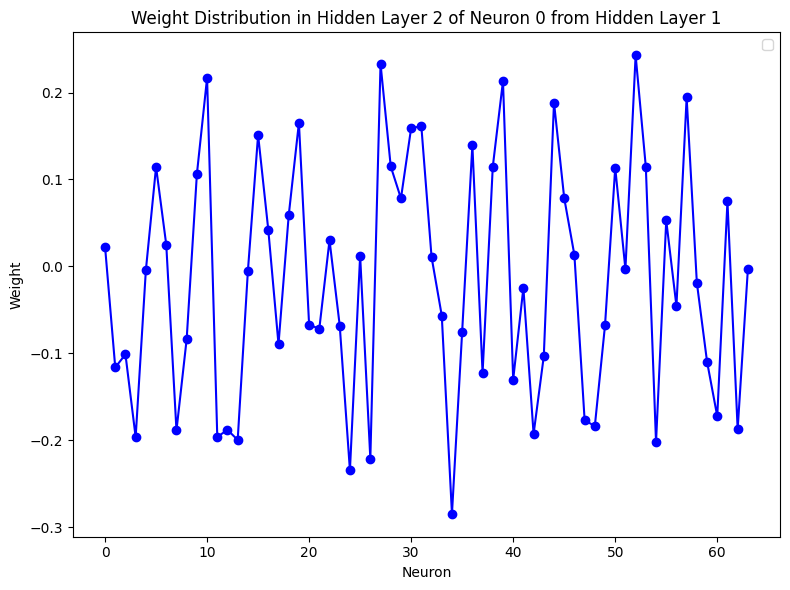

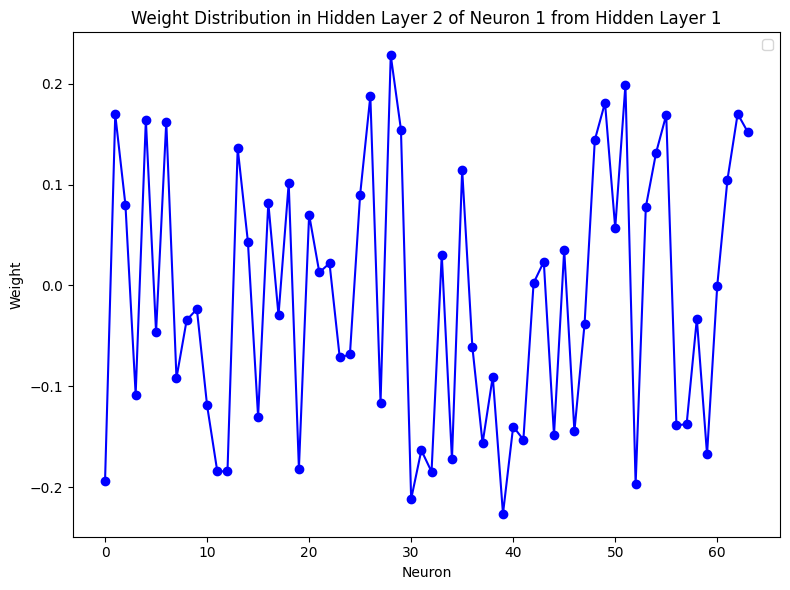

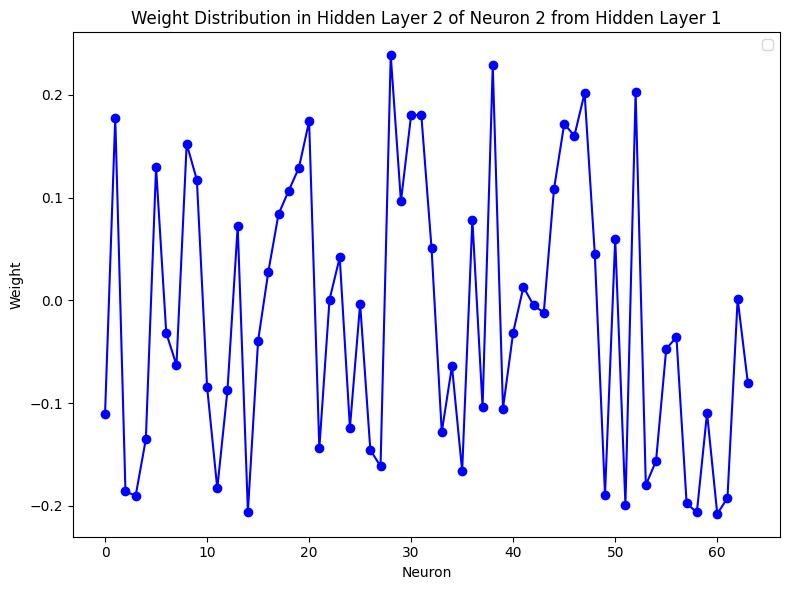

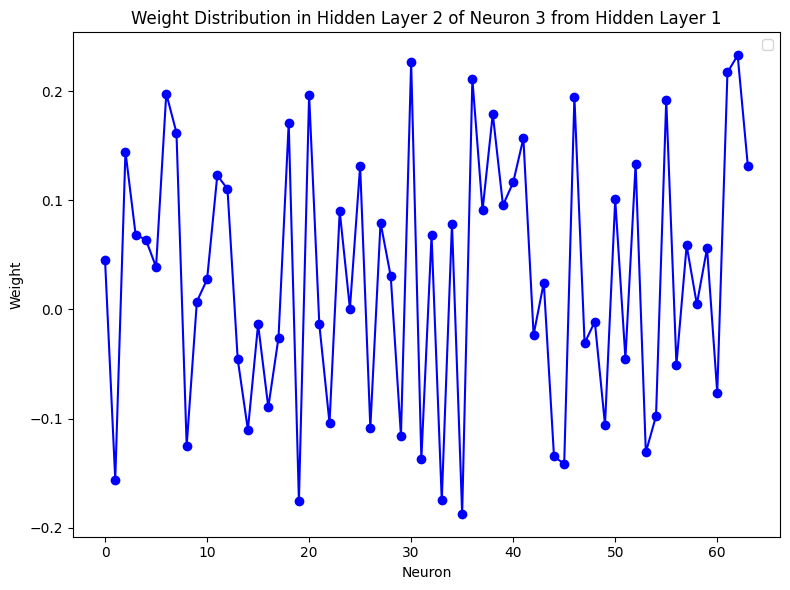

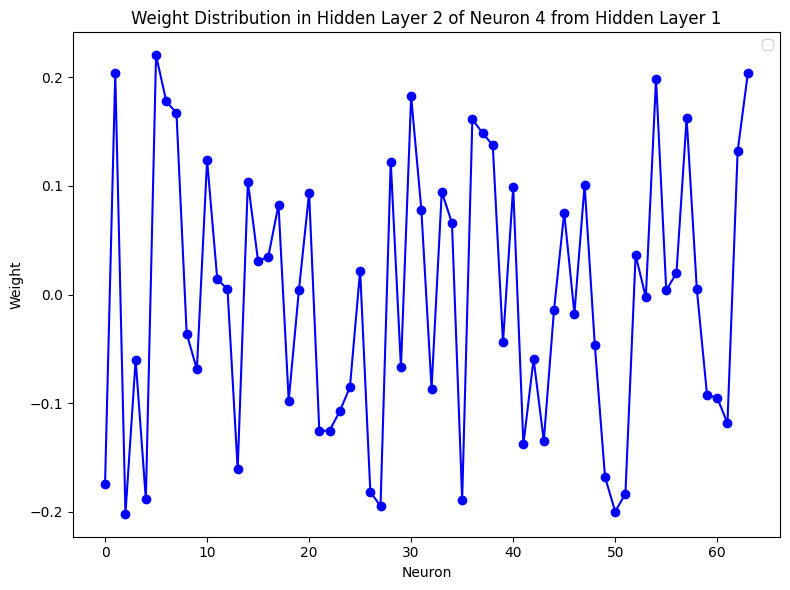

...

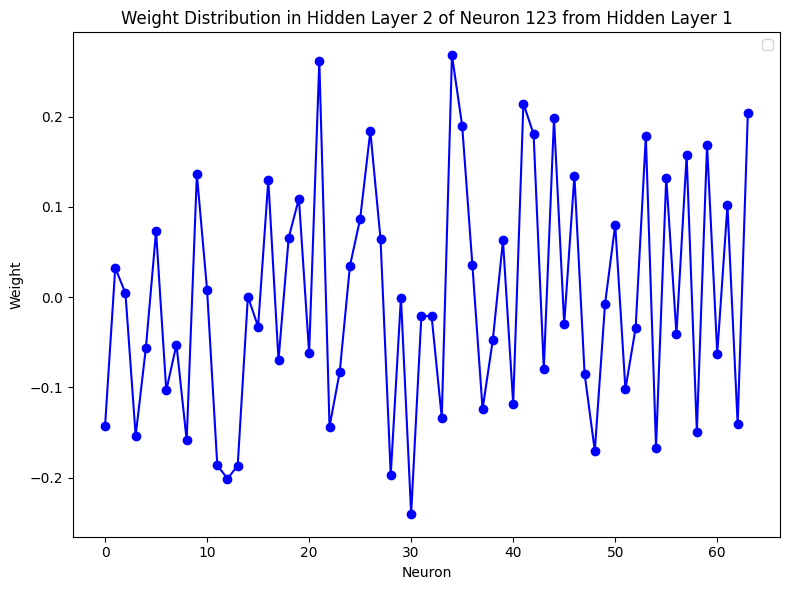

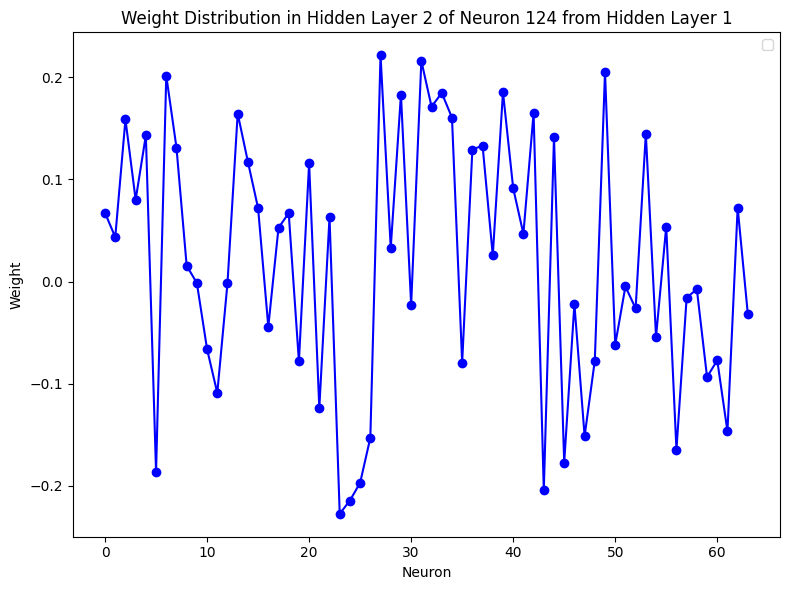

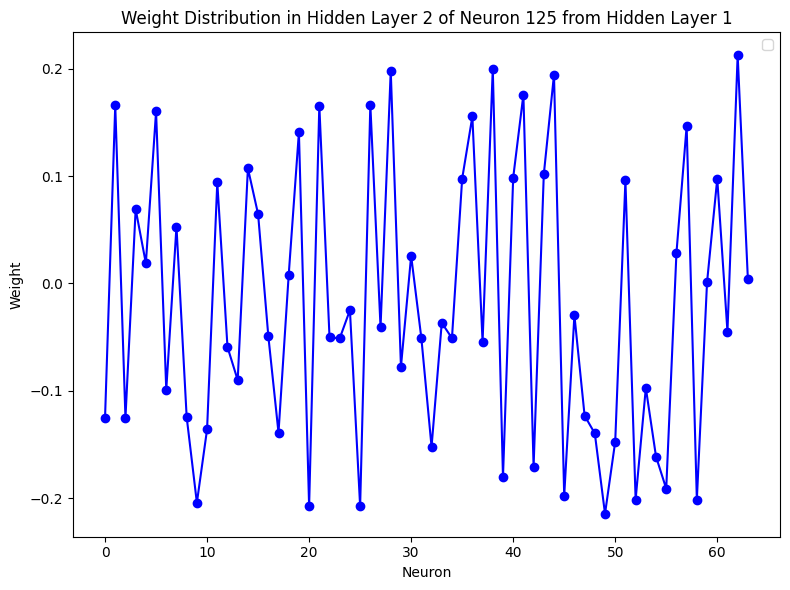

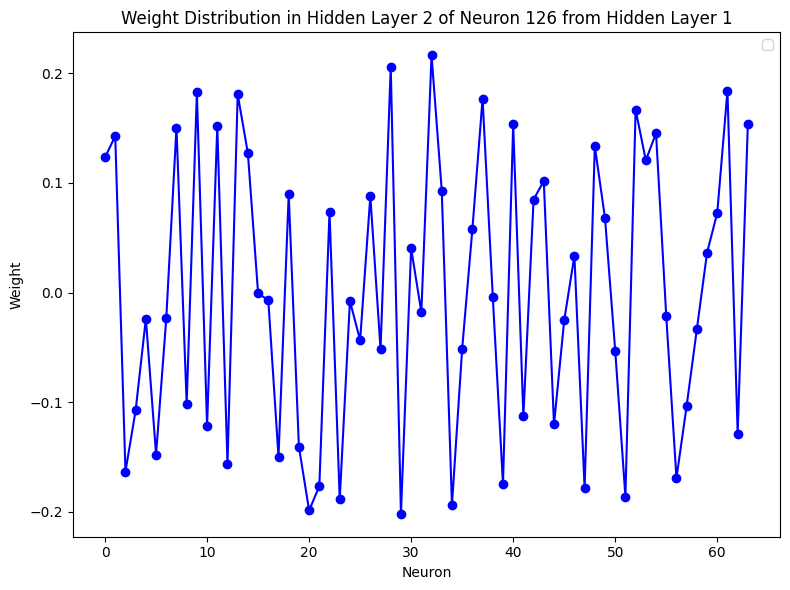

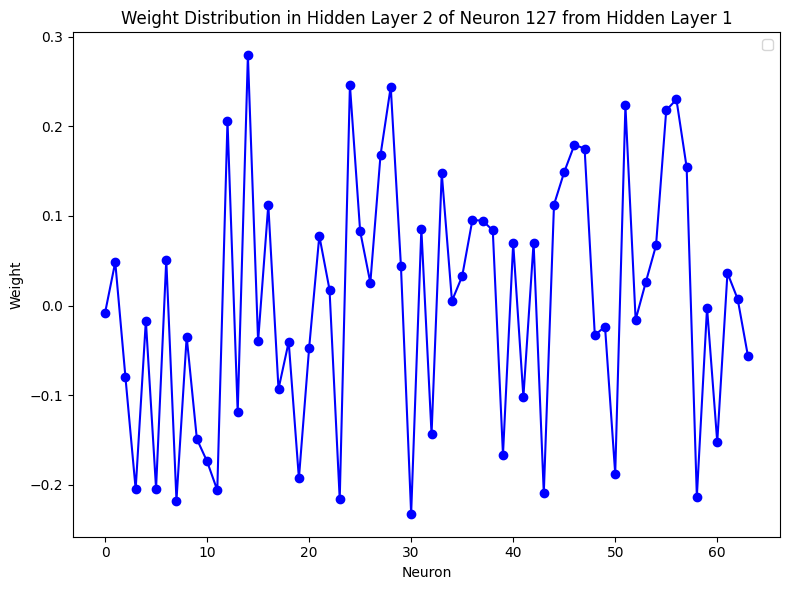

In [ ]:
outgoing_weights1 = []
for neuron in range(128):
  weights = []
  for i in range(64):
    weights.append(hidden_layer2_weights[i][neuron])
  outgoing_weights1.append(weights)
  fig, ax = plt.subplots(figsize=(8, 6))
  ax.plot(range(0, 64), weights, marker='o', linestyle='-', color='blue')

  # Set titles and labels
  ax.set_title(f'Weight Distribution in Hidden Layer 2 of Neuron {neuron} from Hidden Layer 1')
  ax.set_xlabel('Neuron')
  ax.set_ylabel('Weight')

  # Add a legend
  ax.legend()

  # Show the plot
  plt.tight_layout()
  plt.show()

## Weights from Hidden Layer 2 to Output Layer

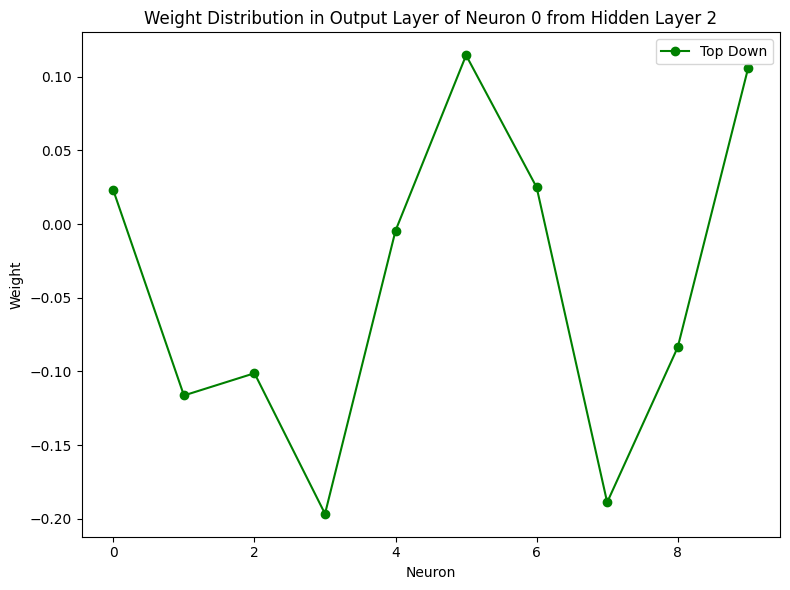

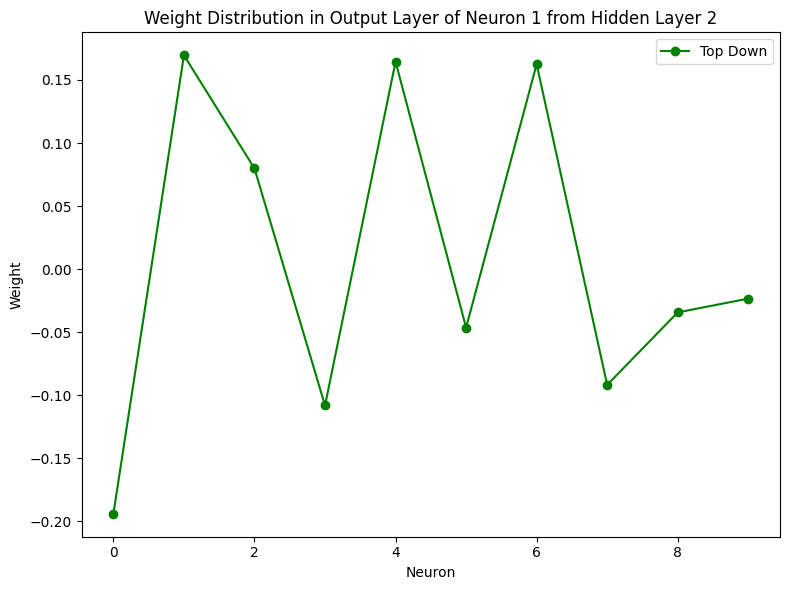

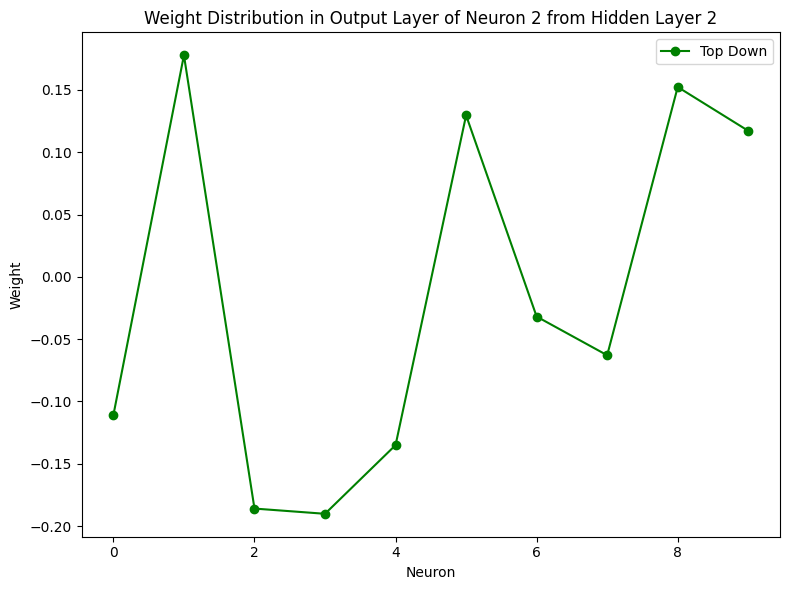

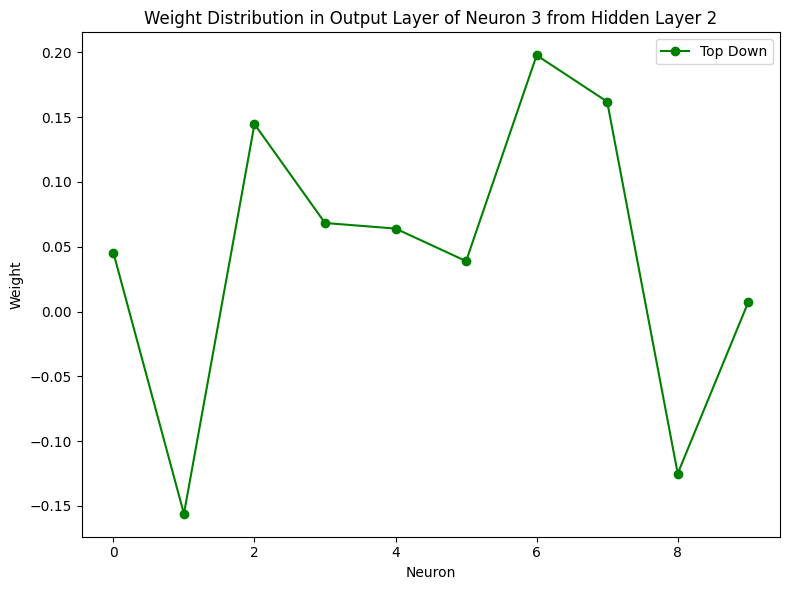

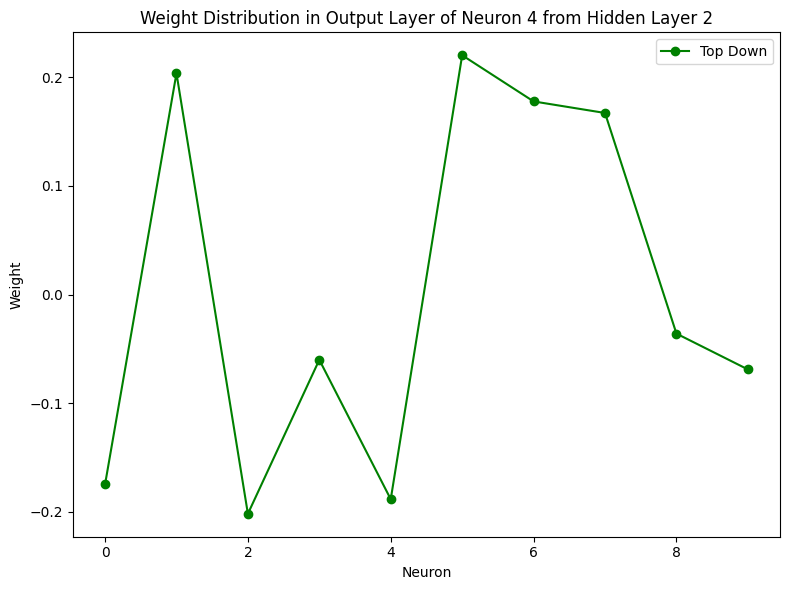

...

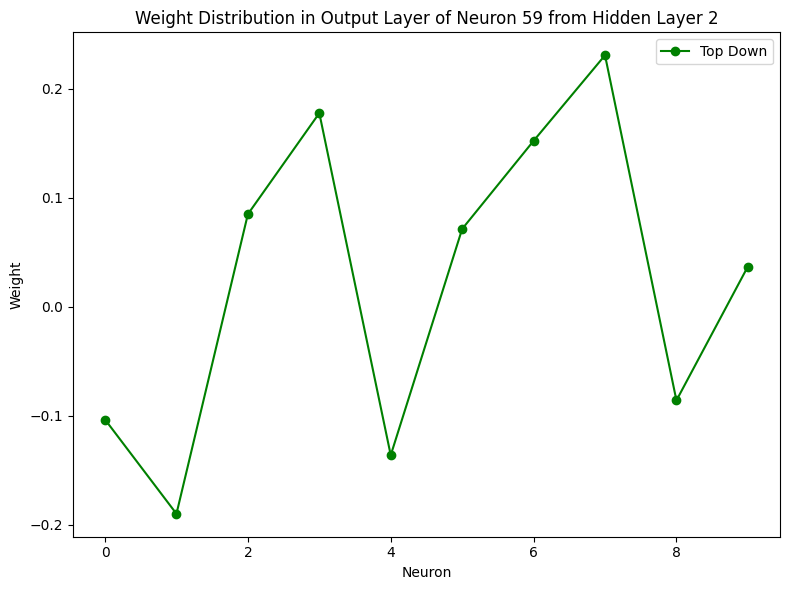

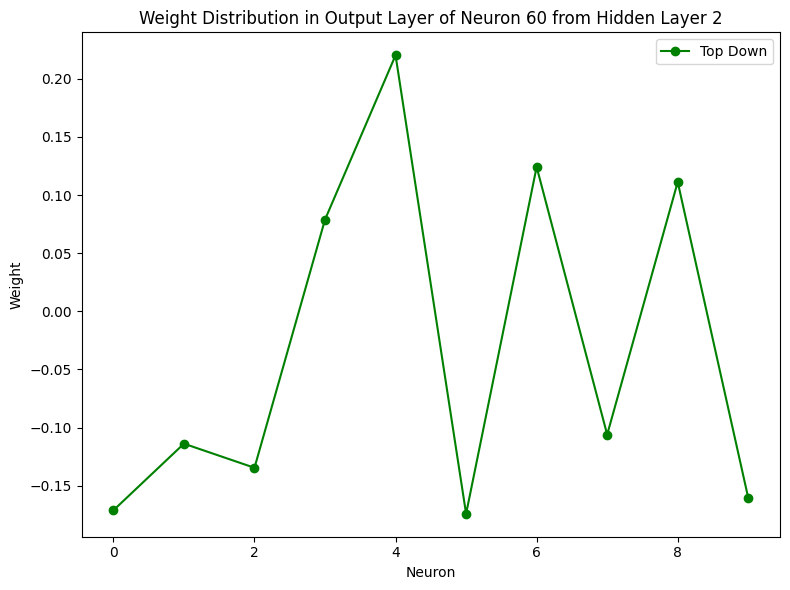

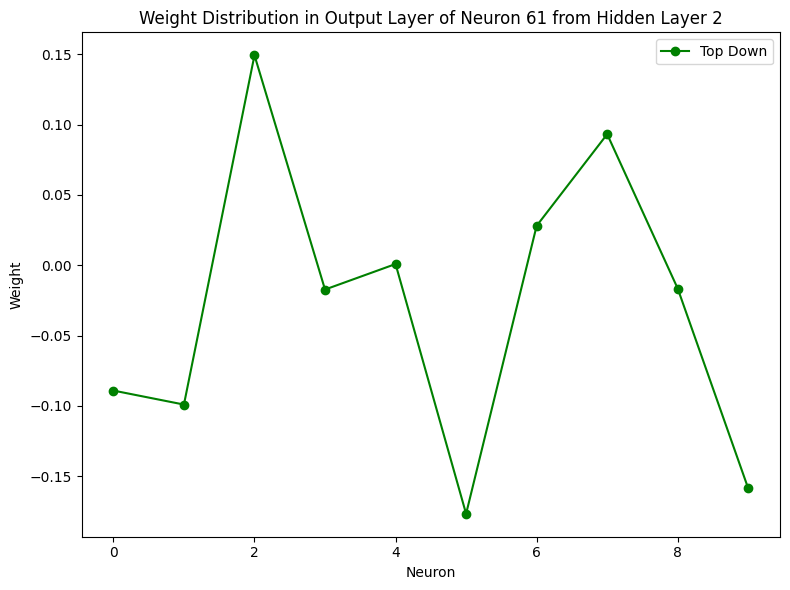

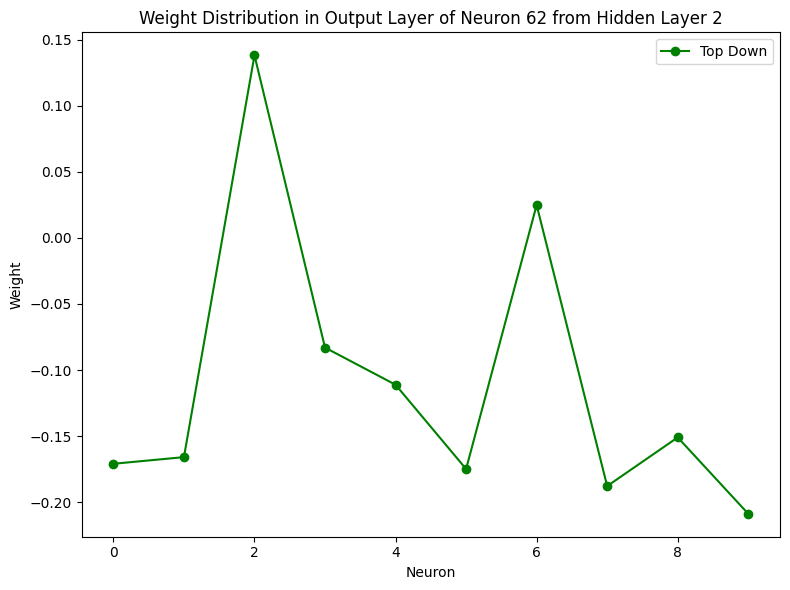

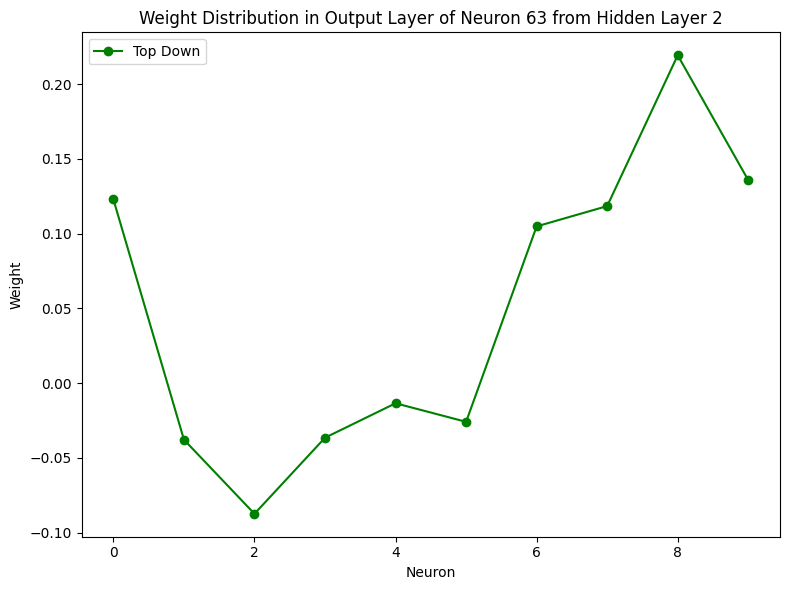

In [ ]:
outgoing_weights = []
for neuron in range(64):
  weights = []
  for i in range(10):
    weights.append(hidden_layer2_weights[i][neuron])
  outgoing_weights.append(weights)
  fig, ax = plt.subplots(figsize=(8, 6))
  ax.plot(range(0, 10), weights, marker='o', linestyle='-', color='green')

  # Set titles and labels
  ax.set_title(f'Weight Distribution in Output Layer of Neuron {neuron} from Hidden Layer 2')
  ax.set_xlabel('Neuron')
  ax.set_ylabel('Weight')

  # Add a legend
  ax.legend()

  # Show the plot
  plt.tight_layout()
  plt.show()

## KL-Divergence of Incoming and Outgoing Weights - Hidden Layer 1

In [ ]:
from scipy.special import kl_div
kl_divs1 = []

for i in range(128):
  padded_distribution = np.pad(outgoing_weights1[i], (0, 720))
  kl_divergences = kl_div(padded_distribution, hidden_layer1_weights[i])
  kl_divergence = [kl.item() for kl in kl_divergences if kl != float('inf')]
  kl_divergence = sum(kl_divergence)
  kl_divs1.append(kl_divergence)

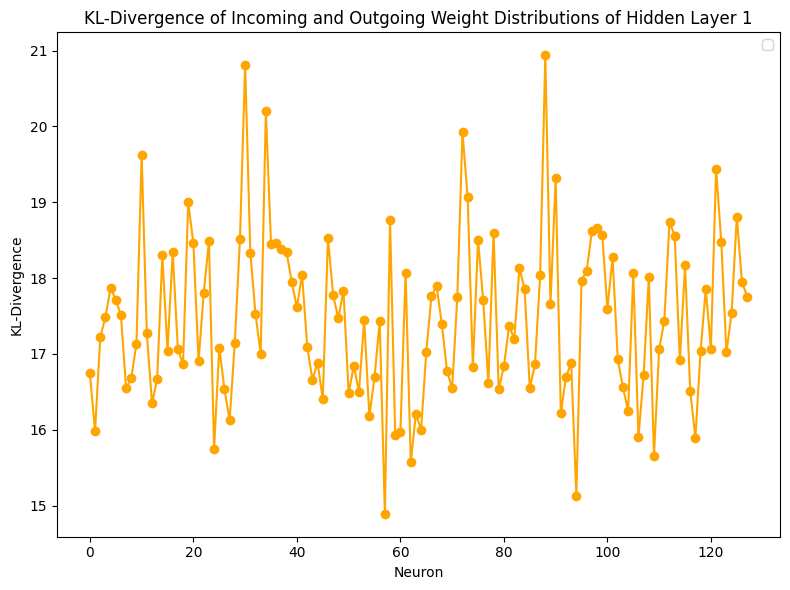

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(range(0, 128), kl_divs1, marker='o', linestyle='-', color='orange')

# Set titles and labels
ax.set_title(f'KL-Divergence of Incoming and Outgoing Weight Distributions of Hidden Layer 1')
ax.set_xlabel('Neuron')
ax.set_ylabel('KL-Divergence')

# Add a legend
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

## KL-Divergence of Incoming and Outgoing Weights - Hidden Layer 2

In [ ]:
print(len(outgoing_weights))
print(len(hidden_layer2_weights))

64
64


In [ ]:
from scipy.special import kl_div
kl_divs = []

for i in range(64):
  padded_distribution = np.pad(outgoing_weights[i], (0, 118))
  kl_divergences = kl_div(padded_distribution, hidden_layer2_weights[i])
  kl_divergence = [kl.item() for kl in kl_divergences if kl != float('inf')]
  kl_divergence = sum(kl_divergence)
  kl_divs.append(kl_divergence)

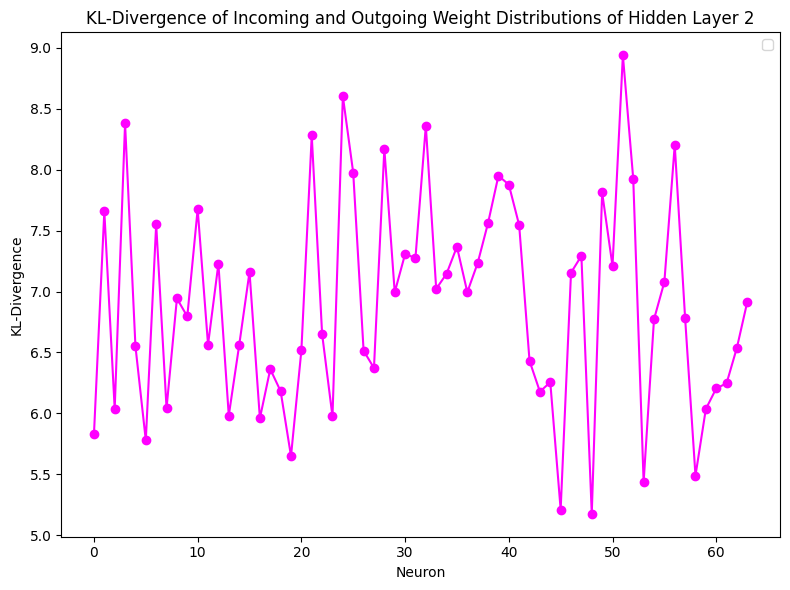

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(range(0, 64), kl_divs, marker='o', linestyle='-', color='magenta')

# Set titles and labels
ax.set_title(f'KL-Divergence of Incoming and Outgoing Weight Distributions of Hidden Layer 2')
ax.set_xlabel('Neuron')
ax.set_ylabel('KL-Divergence')

# Add a legend
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# prebuilt_hidden_layer1_weights = []
# prebuilt_hidden_layer2_weights = []
# prebuilt_output_layer_weights = []

# for name, weight in model2.named_parameters():
#   if "weights" in name:
#     if "hidden_layer1" in name:
#       hidden_layer1_weights.append(weight[0].detach().numpy())
#     elif "hidden_layer2" in name:
#       hidden_layer2_weights.append(weight[0].detach().numpy())
#     else:
#       output_layer_weights.append(weight[0].detach().numpy())